In [27]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sb

In [28]:
data = pd.read_json('merged.json', orient='records')

In [29]:
data

,Country,Year,Region,Score,GDP per capita,Social support,Life expectancy,Freedom to make life choices,Perceptions of corruption,Generosity,Code,Target,Target_n
0,Switzerland,2015,Western Europe,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,CHE,Top,3
1,Iceland,2015,Western Europe,7.561,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,ISL,Top,3
2,Denmark,2015,Western Europe,7.527,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,DNK,Top,3
3,Norway,2015,Western Europe,7.522,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,NOR,Top,3
4,Canada,2015,North America,7.427,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,CAN,Top,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
770,Rwanda,2019,Sub-Saharan Africa,3.334,0.35900,0.71100,0.61400,0.55500,0.41100,0.21700,RWA,Low,0
771,"Tanzania, United Republic of",2019,Sub-Saharan Africa,3.231,0.47600,0.88500,0.49900,0.41700,0.14700,0.27600,TZA,Low,0
772,Afghanistan,2019,Southern Asia,3.203,0.35000,0.51700,0.36100,0.00000,0.02500,0.15800,AFG,Low,0
773,Central African Republic,2019,Sub-Saharan Africa,3.083,0.02600,0.00000,0.10500,0.22500,0.03500,0.23500,CAF,Low,0


In [30]:
# we calculate quartiles on the data
targets = ['Low', 'Low-Mid', 'Top-Mid', 'Top']

data['Target'] = pd.qcut(data[data.columns[3]], len(targets), labels=targets)
data['Target_n'] = pd.qcut(data[data.columns[3]], len(targets), labels=range(len(targets)))

In [31]:
data.to_json('merged.json', orient='records')

In [32]:
data

,Country,Year,Region,Score,GDP per capita,Social support,Life expectancy,Freedom to make life choices,Perceptions of corruption,Generosity,Code,Target,Target_n
0,Switzerland,2015,Western Europe,7.587,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,CHE,Top,3
1,Iceland,2015,Western Europe,7.561,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,ISL,Top,3
2,Denmark,2015,Western Europe,7.527,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,DNK,Top,3
3,Norway,2015,Western Europe,7.522,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,NOR,Top,3
4,Canada,2015,North America,7.427,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,CAN,Top,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
770,Rwanda,2019,Sub-Saharan Africa,3.334,0.35900,0.71100,0.61400,0.55500,0.41100,0.21700,RWA,Low,0
771,"Tanzania, United Republic of",2019,Sub-Saharan Africa,3.231,0.47600,0.88500,0.49900,0.41700,0.14700,0.27600,TZA,Low,0
772,Afghanistan,2019,Southern Asia,3.203,0.35000,0.51700,0.36100,0.00000,0.02500,0.15800,AFG,Low,0
773,Central African Republic,2019,Sub-Saharan Africa,3.083,0.02600,0.00000,0.10500,0.22500,0.03500,0.23500,CAF,Low,0


In [17]:
spearman_cormatrix = data[data.columns[2:]].corr(method='spearman')
spearman_cormatrix

,Score,GDP per capita,Social support,Life expectancy,Freedom to make life choices,Perceptions of corruption,Generosity
Score,1.000000,0.807727,0.645849,0.764058,0.542335,0.272378,0.123760
GDP per capita,0.807727,1.000000,0.585945,0.793951,0.363013,0.218997,0.001842
Social support,0.645849,0.585945,1.000000,0.588481,0.435720,0.053126,-0.035012
Life expectancy,0.764058,0.793951,0.588481,1.000000,0.361149,0.145906,0.010314
Freedom to make life choices,0.542335,0.363013,0.435720,0.361149,1.000000,0.426464,0.333002
Perceptions of corruption,0.272378,0.218997,0.053126,0.145906,0.426464,1.000000,0.264895
Generosity,0.123760,0.001842,-0.035012,0.010314,0.333002,0.264895,1.000000


<AxesSubplot:>

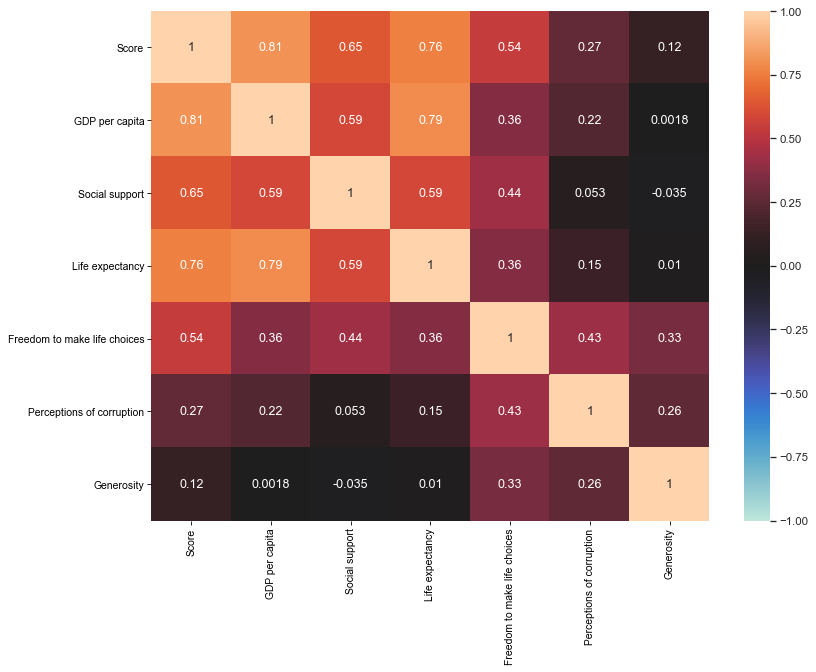

In [18]:
# we calculated correlation matrixed of the Spearman kind, now we graph it
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 9), dpi=75)

sb.set(style='whitegrid')

sb.heatmap(spearman_cormatrix, vmin=-1, vmax=1, ax=ax, center=0, annot=True)

In [19]:
""" 
On the above graph, we can see that there's a strong correlation between the happiness score and social support, life expectancy and mainly GDP per capita. And there's less of a connection between the score and humanly matters like generosity, or the overall level of perceived corruption in a specific country.
"""

" \nOn the above graph, we can see that there's a strong correlation between the happiness score and social support, life expectancy and mainly GDP per capita. And there's less of a connection between the score and humanly matters like generosity, or the overall level of perceived corruption in a specific country.\n"

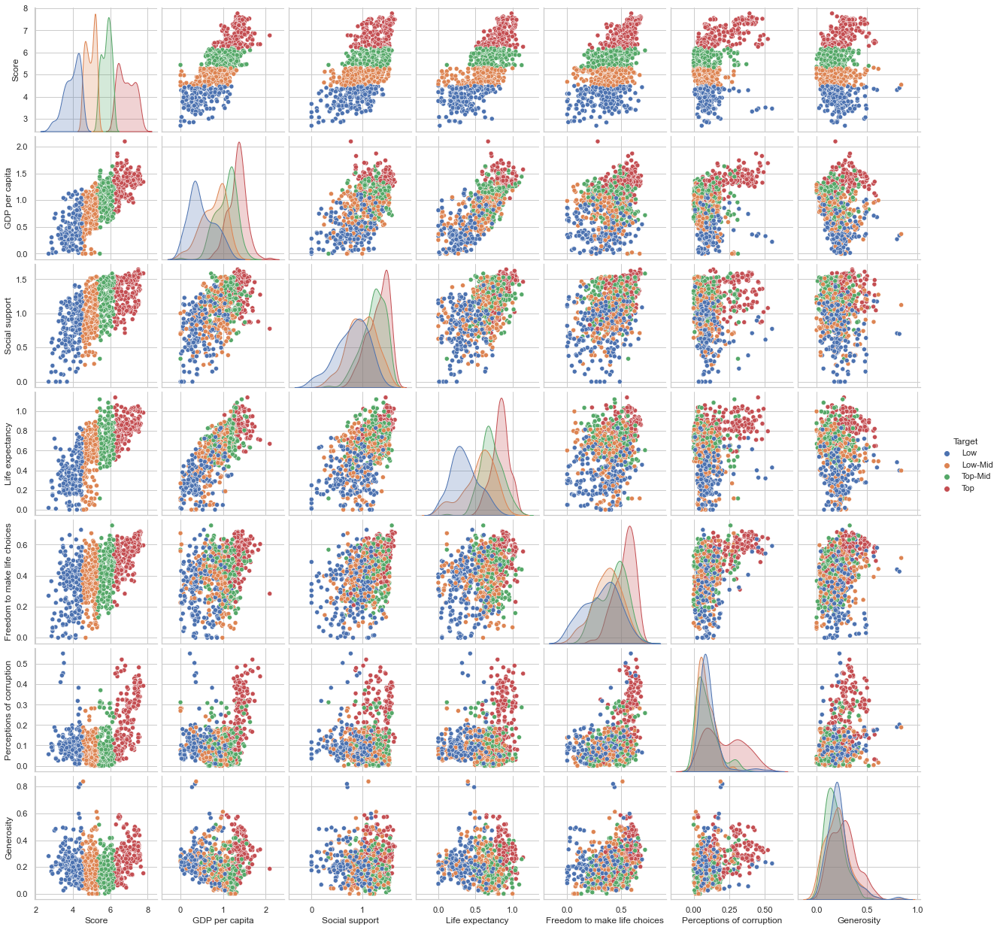

In [24]:
sb.set(style='whitegrid')

sb.pairplot(data[data.columns[2:-1]], hue='Target')

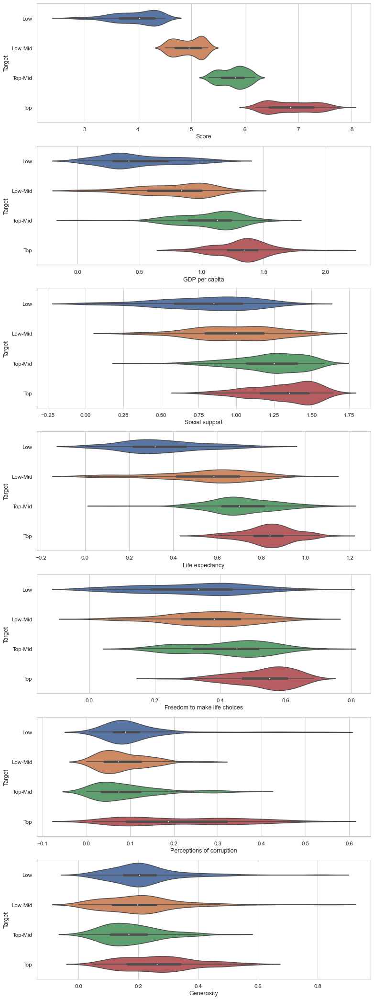

In [51]:
fig, axis = plt.subplots(nrows=7, ncols=1, figsize=(12, 36), dpi=75)

sb.set(style='whitegrid')

for i, col in enumerate(data.columns[3:-3]):
    sb.violinplot(x=data[col], y='Target', data=data, ax=axis[i])

<AxesSubplot:xlabel='Score', ylabel='GDP per capita'>

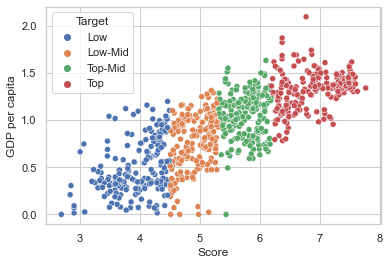

In [55]:
sb.set(style='whitegrid')
sb.scatterplot(x='Score', y='GDP per capita', data=data, hue='Target')

In [64]:
d2015 = data[data.Year == 2015]
d2019 = data[data.Year == 2019]
d2015 = d2015[['Country', 'Score']]
d2019 = d2019[['Country', 'Score']]

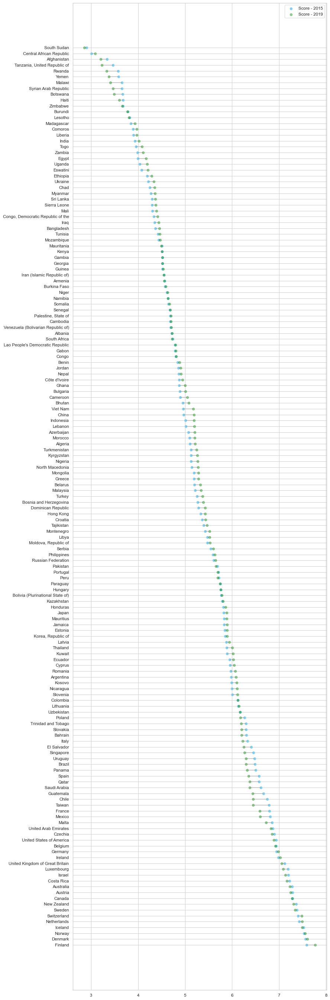

In [85]:
plt.figure(figsize=(12, 36), dpi=75)
plt.hlines(y=range(1, len(d2019['Country']) + 1), xmin=d2015['Score'][:-1], xmax=d2019['Score'], color='grey', alpha=.4)
plt.scatter(d2015['Score'][:-1], range(1, len(d2019['Country']) + 1), color='skyblue', alpha=1, label='Score - 2015')
plt.scatter(d2019['Score'], range(1, len(d2019['Country']) + 1), color='green', alpha=.4, label='Score - 2019')
plt.yticks(range(1, len(d2019['Country']) + 1), d2019['Country'])
plt.legend()
plt.tight_layout()

{'Australia and New Zealand',
 'Central and Eastern Europe',
 'Eastern Asia',
 'Latin America and Caribbean',
 'Middle East and Northern Africa',
 'North America',
 'Southeastern Asia',
 'Southern Asia',
 'Sub-Saharan Africa',
 'Western Europe'}

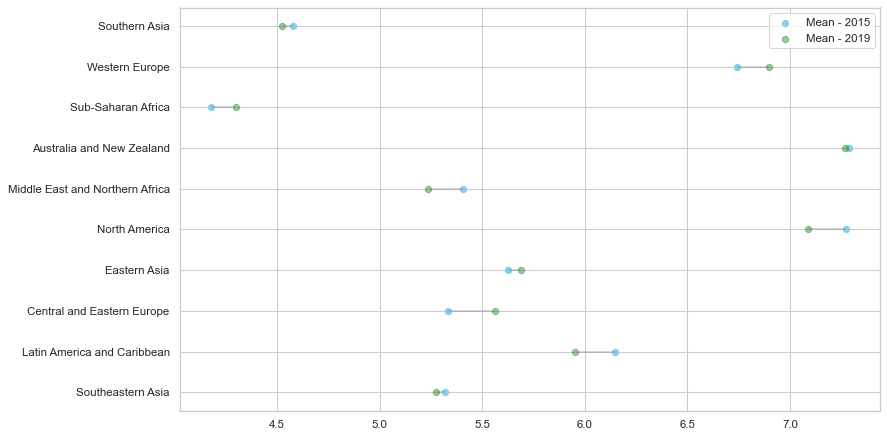

In [125]:
d = data[['Region', 'Score', 'Year']]
regions = set(data['Region'])
means2015 = []
means2019 = []
rg = range(1, len(regions) + 1)

for r in regions:
    means2015.append(d[(d.Year == 2015) & (d.Region == r)].mean(axis=0)['Score'])

for r in regions:
    means2019.append(d[(d.Year == 2019) & (d.Region == r)].mean(axis=0)['Score'])

plt.figure(figsize=(12, 6), dpi=75)
plt.hlines(y=rg, xmin=means2015, xmax=means2019, color='grey', alpha=.4)
plt.scatter(x=means2015, y=rg, color='skyblue', alpha=1, label='Mean - 2015')
plt.scatter(x=means2019, y=rg, color='green', alpha=.4, label='Mean - 2019')
plt.yticks(rg, regions)
plt.tight_layout()
plt.legend()